In [1]:
import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import (
    InceptionResNetV2,
)

import numpy as np

from matplotlib import *
from matplotlib import pyplot
from matplotlib.pyplot import *

import cv2
from PIL import Image

import glob 
import os
import sys
import datetime

from skimage import metrics
from skimage.metrics import structural_similarity as ssim

In [2]:
NOISE_FLOOR = 30
BATCH_SIZE = 16
LATENT_DIM = 100
IMAGE_SIZE = 128
CHANNEL_NUM = 3
G_LEARNING_RATE = 0.0002
D_LEARNING_RATE = 0.0001
G_DECAY = 0.5
D_DECAY = 0.5
EPOCHS = 3002
DISPLAY_SAMPLES = 5

In [3]:
tf.config.experimental.list_physical_devices('GPU')
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))


def reduce_noise(noisy_img, noise_floor=NOISE_FLOOR):
    clean_img = np.array(noisy_img)
    clean_img[noisy_img < NOISE_FLOOR] = 0
    return clean_img


#check current directory and import images
print(os.getcwd()) 
filelist=glob.glob('/kaggle/input/cropped-images/Cropped_images/pituitary/*.jpg')
train_size = len(filelist)

images0 = []
for i in filelist[0:train_size]:
    if CHANNEL_NUM == 1:
        image = cv2.imread(i, cv2.IMREAD_GRAYSCALE)
    else: 
        image = cv2.imread(i, cv2.IMREAD_COLOR)
        image = reduce_noise(image)
        image = (image - np.min(image)) / (np.max(image) - np.min(image))
        # Rescale the pixel values to be between -1 and 1
        image = (image * 2) - 1
        
        image = cv2.resize(image, (128,128))
        images0.append(image)
images = np.array(images0)
print('training images',images.shape)

Num GPUs Available:  1
/kaggle/working
training images (930, 128, 128, 3)


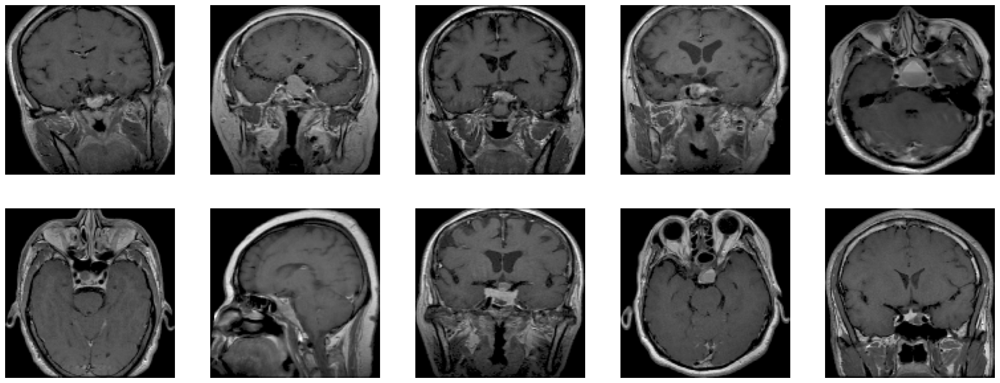

In [4]:
pyplot.figure(figsize=(25,25))
for i in range(10):
    # define subplot
    pyplot.subplot(5, 5, 1 + i)
    # turn off axis
    pyplot.axis('off')
    # plot raw pixel data
    pyplot.imshow(images[i,:,:,0],cmap='gray')
pyplot.show()


In [6]:
def define_generator():

    model = tf.keras.Sequential()

    model.add(Dense(32*32*256, input_shape=(100,)))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Reshape((32, 32,256)))

    model.add(Conv2DTranspose(256, (3,3), strides=(2,2), activation= 'relu', padding='same', use_bias=False))
    model.add(LeakyReLU(alpha=0.2))
    
    model.add(Conv2DTranspose(256, (3,3), strides=(2,2), activation= 'relu', padding='same', use_bias=False))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Conv2D(CHANNEL_NUM, (3,3), activation= 'tanh', strides=(1,1), padding='same', use_bias=False))
    model.summary()
    return model

In [7]:
define_generator()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 262144)            26476544  
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 262144)            0         
                                                                 
 reshape (Reshape)           (None, 32, 32, 256)       0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 64, 64, 256)      589824    
 nspose)                                                         
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 64, 64, 256)       0         
                                                                 
 conv2d_transpose_1 (Conv2DT  (None, 128, 128, 256)    589824    
 ranspose)                                              

In [8]:

def define_discriminator(input=(128,128,CHANNEL_NUM)):

    model = tf.keras.Sequential()
    
    model.add(Conv2D(128, (3,3), strides=(2, 2), padding='same',input_shape=input))
    model.add(BatchNormalization())
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.2))
    
    
    model.add(Conv2D(128, (3,3), strides=(2, 2), padding='same'))
    model.add(BatchNormalization())
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.2))

    model.add(Conv2D(128, (3,3), strides=(2, 2), padding='same'))
    model.add(BatchNormalization())
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.2))
    
    model.add(Conv2D(128, (3,3), strides=(2, 2), padding='same'))
    model.add(BatchNormalization())
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.5))
    
    model.add(Flatten())
    model.add(Dense(1, activation= 'sigmoid'))
    model.summary()
    return model


In [9]:
define_discriminator()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_1 (Conv2D)           (None, 64, 64, 128)       3584      
                                                                 
 batch_normalization (BatchN  (None, 64, 64, 128)      512       
 ormalization)                                                   
                                                                 
 leaky_re_lu_3 (LeakyReLU)   (None, 64, 64, 128)       0         
                                                                 
 dropout (Dropout)           (None, 64, 64, 128)       0         
                                                                 
 conv2d_2 (Conv2D)           (None, 32, 32, 128)       147584    
                                                                 
 batch_normalization_1 (Batc  (None, 32, 32, 128)      512       
 hNormalization)                                      

In [10]:
G_MODEL = define_generator()

D_MODEL = define_discriminator()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2 (Dense)             (None, 262144)            26476544  
                                                                 
 leaky_re_lu_7 (LeakyReLU)   (None, 262144)            0         
                                                                 
 reshape_1 (Reshape)         (None, 32, 32, 256)       0         
                                                                 
 conv2d_transpose_2 (Conv2DT  (None, 64, 64, 256)      589824    
 ranspose)                                                       
                                                                 
 leaky_re_lu_8 (LeakyReLU)   (None, 64, 64, 256)       0         
                                                                 
 conv2d_transpose_3 (Conv2DT  (None, 128, 128, 256)    589824    
 ranspose)                                            

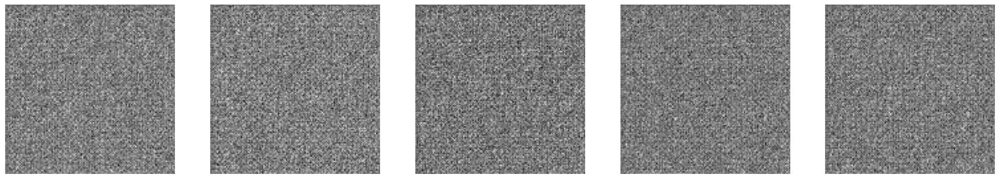

In [11]:
#generate noise according to number of samples specified with latent_dim previously defined as 256
noise = tf.random.normal([DISPLAY_SAMPLES, LATENT_DIM])

#generate fake images
x_fake = G_MODEL(noise,training=False)
pyplot.figure(figsize=(25,25))
for i in range(DISPLAY_SAMPLES):
    # define subplot
    pyplot.subplot(5, 5, 1 + i)
    pyplot.axis('off')
    # plot single image
    pyplot.imshow(x_fake[i, :, :,0],cmap='gray')
pyplot.show()
pyplot.close()


# Defining the loss functions

In [12]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss, fake_loss, real_loss

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

In [13]:

generator_optimizer = tf.keras.optimizers.Adam(G_LEARNING_RATE, G_DECAY)

discriminator_optimizer = tf.keras.optimizers.Adam(D_LEARNING_RATE, D_DECAY)

In [14]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=G_MODEL,
                                 discriminator=D_MODEL)

# Training function

In [15]:
@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, LATENT_DIM])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = G_MODEL(noise, training=True)

        real_output = D_MODEL(images, training=True)
        fake_output = D_MODEL(generated_images, training=True)

        g_loss = generator_loss(fake_output)
        d_loss, fake_loss, real_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(g_loss, G_MODEL.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(d_loss, D_MODEL.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, G_MODEL.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, D_MODEL.trainable_variables))
    return d_loss, g_loss, fake_loss, real_loss

In [16]:
#Define training loop

BATCH_PER_EPOCH=np.round(images.shape[0]/BATCH_SIZE)

total_size=images.shape[0]

# Batch and shuffle the data
train_dataset = tf.data.Dataset.from_tensor_slices(images).shuffle(total_size).batch(BATCH_SIZE)


In [17]:
from matplotlib import pyplot as plt

def plot_learning_curve(epoch, d_loss_lst, gan_loss_lst, real, fake):
  fig = plt.figure()
  plt.plot(d_loss_lst, color='skyblue')
  plt.plot(gan_loss_lst, color='gold')
  plt.plot(real, color='green')
  plt.plot(fake, color='red')
  plt.title('Model Learning Curve')
  plt.xlabel('Epochs'); plt.ylabel('Cross Entropy Loss')
  plt.savefig(f'/kaggle/working/Learning Curves_{epoch}.png')

  plt.show()
  

# Training Loop

In [18]:
def train(dataset, epochs):
    d_hist = []
    g_hist = []
    real_hist = []
    fake_hist = []
    for epoch in range(epochs):
        count=0
        for image_batch in dataset:
            d_loss,g_loss, fake_loss, real_loss=train_step(image_batch)
            d_hist.append(d_loss)
            g_hist.append(g_loss)
            fake_hist.append(fake_loss)
            real_hist.append(real_loss)
            if (count) % 25 == 0:
                print('>%d, %d/%d, d=%.8f, g=%.8f' % (epoch, count, BATCH_PER_EPOCH, d_loss, g_loss))
            if ((count) % 250 == 0) or (epoch == 1999) or (epoch == 4999):
                noise = tf.random.normal([DISPLAY_SAMPLES, LATENT_DIM])
                x_fake = G_MODEL(noise,training=False)
                pyplot.figure(figsize=(25,25))
                if epoch % 200 ==0:
                    for i in range(DISPLAY_SAMPLES):
                        # define subplot
                        pyplot.subplot(5, 5, 1 + i)
                        pyplot.axis('off')
                        # plot single image
                        pyplot.imshow(x_fake[i, :, :,0],cmap='gray')

                    pyplot.savefig('/kaggle/working/Epoch_{}.png'.format(epoch))
                    plot_learning_curve(epoch, d_hist, g_hist, real_hist, fake_hist) 
#                     pyplot.show()
                    pyplot.close()
            count=count+1
            
        if epoch == 4000 or epoch == 500 or epoch == 1000 or epoch == 2000 or epoch == 3000 or epoch == 3500 or epoch == 2500:
            filename = '/kaggle/working/generator_model_' + str(epoch) + '.h5'
            G_MODEL.save(filename)
            print("Model Saved!")
    return d_hist,g_hist, fake_hist, real_hist, G_MODEL

/opt/conda/lib/python3.7/site-packages/keras/backend.py:5677: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Sigmoid activation and thus does not represent logits. Was this intended?
  output, from_logits, "Sigmoid", "binary_crossentropy"
2023-03-15 19:29:13.566896: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_3/dropout_4/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


>0, 0/58, d=2.12601662, g=0.41849449


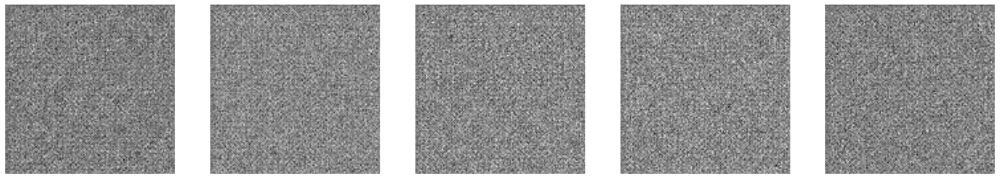

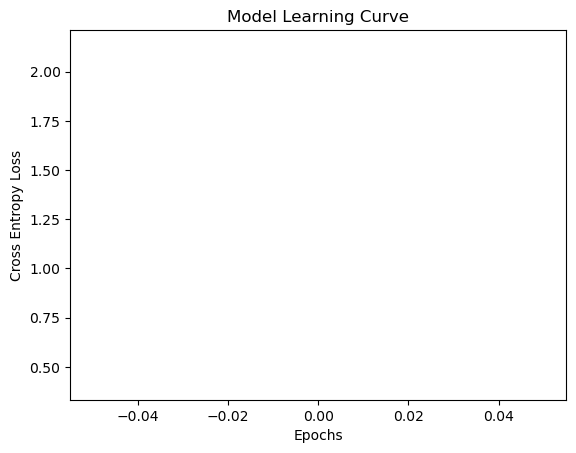

>0, 25/58, d=5.51687574, g=0.02040221
>0, 50/58, d=4.31121731, g=0.18451130


2023-03-15 19:29:25.558723: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_3/dropout_4/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


>1, 0/58, d=2.72186279, g=0.22702581
>1, 25/58, d=2.93714261, g=0.34136283
>1, 50/58, d=0.96973610, g=1.38843155
>2, 0/58, d=0.40403718, g=3.42675900
>2, 25/58, d=0.28880823, g=2.72292495
>2, 50/58, d=0.37659097, g=2.49090505
>3, 0/58, d=0.11217453, g=4.23637390
>3, 25/58, d=0.23786299, g=3.49950409
>3, 50/58, d=0.05633409, g=3.51177144
>4, 0/58, d=0.01603844, g=4.98439884
>4, 25/58, d=0.08301129, g=4.93122101
>4, 50/58, d=0.03119932, g=5.07371616
>5, 0/58, d=0.04896640, g=3.76059294
>5, 25/58, d=0.02007524, g=5.18144894
>5, 50/58, d=0.03101833, g=4.50529003
>6, 0/58, d=0.00580750, g=5.77203131
>6, 25/58, d=0.02068784, g=5.09840584
>6, 50/58, d=0.02139111, g=5.53587246
>7, 0/58, d=3.77136230, g=0.61501336
>7, 25/58, d=0.17999354, g=5.09256172
>7, 50/58, d=1.25863898, g=6.35625505
>8, 0/58, d=1.23075891, g=1.82111001
>8, 25/58, d=1.24158370, g=0.74313748
>8, 50/58, d=0.84334731, g=3.54125571
>9, 0/58, d=1.17917728, g=3.09125376
>9, 25/58, d=0.96349072, g=1.60505950
>9, 50/58, d=0.973013

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


>21, 25/58, d=1.02761519, g=0.90839493
>21, 50/58, d=1.13684106, g=1.57364488
>22, 0/58, d=1.78164363, g=1.83458436
>22, 25/58, d=0.89968002, g=1.50511181
>22, 50/58, d=1.17996311, g=1.60431671
>23, 0/58, d=1.30895615, g=1.67504954
>23, 25/58, d=1.40460229, g=0.97600543
>23, 50/58, d=1.07268071, g=2.15535307
>24, 0/58, d=1.25571656, g=1.00471461
>24, 25/58, d=1.10090244, g=1.30710864
>24, 50/58, d=0.88865364, g=1.14372611
>25, 0/58, d=0.87044525, g=1.61994421
>25, 25/58, d=1.28967142, g=1.00585675
>25, 50/58, d=0.85146868, g=1.30146217
>26, 0/58, d=1.16066515, g=0.76998317
>26, 25/58, d=1.26526392, g=1.24591780
>26, 50/58, d=1.00283194, g=1.38112652
>27, 0/58, d=1.88196540, g=2.38370275
>27, 25/58, d=1.10761869, g=1.04889345
>27, 50/58, d=1.17275119, g=0.97265136
>28, 0/58, d=1.44629645, g=0.79966992
>28, 25/58, d=1.38132083, g=1.06773114
>28, 50/58, d=1.32849526, g=0.92426276
>29, 0/58, d=1.26534009, g=0.68416321
>29, 25/58, d=1.38859367, g=0.79437351
>29, 50/58, d=1.00045633, g=1.099

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

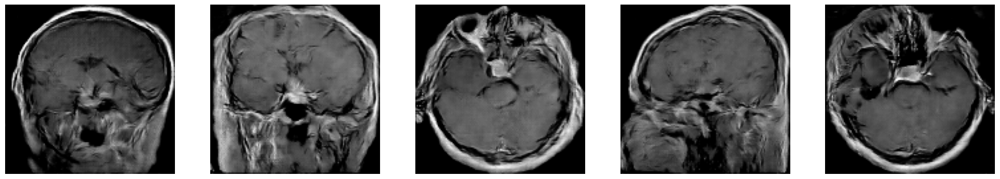

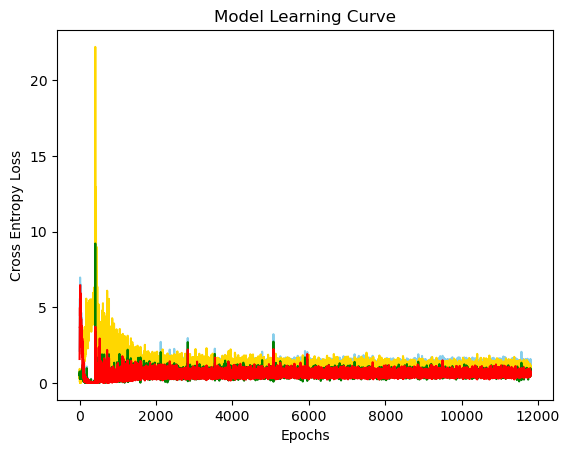

>200, 25/58, d=1.19255102, g=0.95601445
>200, 50/58, d=1.22506523, g=0.97775596
>201, 0/58, d=1.39089370, g=0.93137521
>201, 25/58, d=1.35002232, g=1.57192659
>201, 50/58, d=1.02057076, g=1.11492157
>202, 0/58, d=1.09979820, g=1.01975930
>202, 25/58, d=1.39736080, g=0.79280746
>202, 50/58, d=1.33470845, g=1.04506040
>203, 0/58, d=1.16615558, g=0.82156610
>203, 25/58, d=1.09569788, g=0.74395227
>203, 50/58, d=1.26244450, g=1.26655555
>204, 0/58, d=1.41444170, g=0.55859327
>204, 25/58, d=1.21221387, g=0.95820117
>204, 50/58, d=1.22246683, g=0.89699751
>205, 0/58, d=1.22220361, g=1.21385837
>205, 25/58, d=1.14671230, g=0.81601954
>205, 50/58, d=1.16913319, g=0.82575065
>206, 0/58, d=1.40737283, g=1.02206516
>206, 25/58, d=1.07156610, g=1.12999773
>206, 50/58, d=1.28161144, g=1.19492960
>207, 0/58, d=1.35983825, g=0.79749382
>207, 25/58, d=0.88210988, g=1.25614667
>207, 50/58, d=1.12375832, g=1.34664953
>208, 0/58, d=1.54016352, g=0.49138314
>208, 25/58, d=0.99788105, g=1.10042453
>208, 50

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

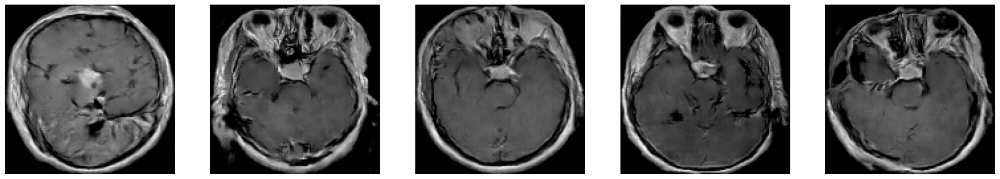

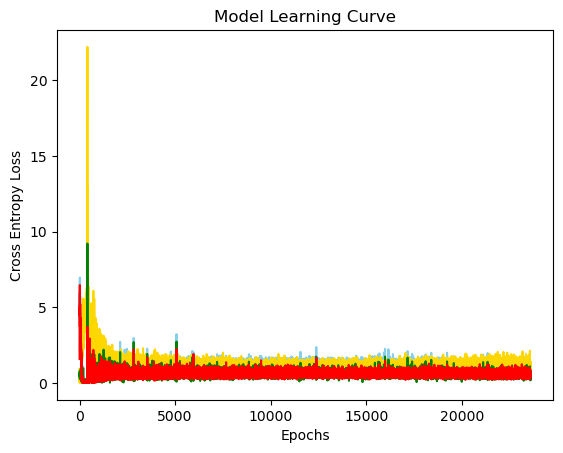

>400, 25/58, d=1.11211991, g=0.91843623
>400, 50/58, d=1.10569501, g=1.97241616
>401, 0/58, d=1.26476717, g=0.81186020
>401, 25/58, d=0.82716203, g=1.40096438
>401, 50/58, d=1.19046438, g=0.86855459
>402, 0/58, d=1.24185729, g=0.76909858
>402, 25/58, d=1.12612319, g=1.05112588
>402, 50/58, d=1.40461957, g=1.06272745
>403, 0/58, d=1.26587176, g=1.01253915
>403, 25/58, d=1.06186771, g=1.32743120
>403, 50/58, d=0.88198972, g=1.09546137
>404, 0/58, d=0.87305272, g=1.51801908
>404, 25/58, d=1.29612994, g=1.50393009
>404, 50/58, d=0.99380004, g=0.99725068
>405, 0/58, d=1.15186071, g=1.30917430
>405, 25/58, d=0.92957580, g=1.40925848
>405, 50/58, d=0.97480559, g=0.92016864
>406, 0/58, d=0.97281313, g=1.59276676
>406, 25/58, d=1.02446711, g=1.46225524
>406, 50/58, d=1.04326582, g=1.35319948
>407, 0/58, d=1.22026992, g=0.94068480
>407, 25/58, d=1.22283888, g=1.16902292
>407, 50/58, d=1.27230632, g=1.48797011
>408, 0/58, d=1.21892238, g=1.14317727
>408, 25/58, d=1.28781199, g=1.19254029
>408, 50

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

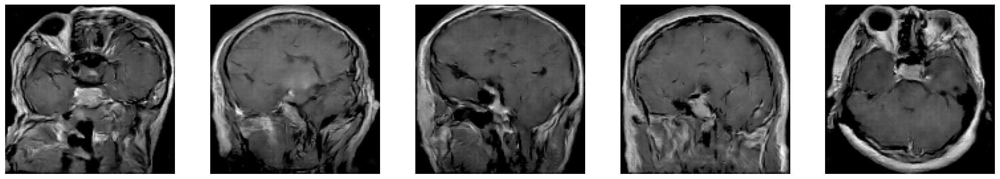

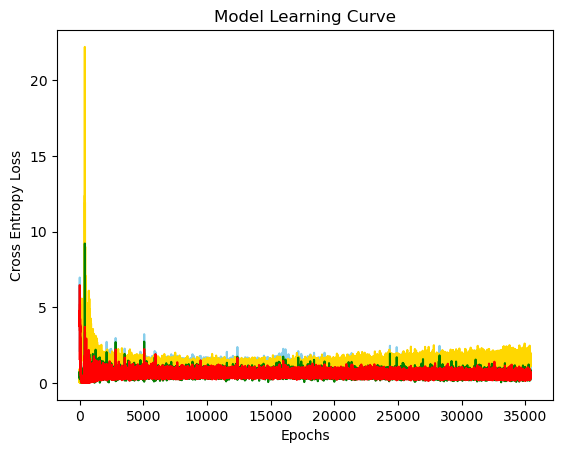

>600, 25/58, d=1.21617246, g=1.20480025
>600, 50/58, d=0.91318792, g=1.43769836
>601, 0/58, d=1.36216080, g=0.51980841
>601, 25/58, d=0.71050465, g=1.50994420
>601, 50/58, d=0.90424138, g=1.61254072
>602, 0/58, d=0.76769334, g=1.59122872
>602, 25/58, d=1.28264678, g=1.32337952
>602, 50/58, d=0.98427582, g=1.52835107
>603, 0/58, d=1.01104474, g=1.54061651
>603, 25/58, d=1.07576060, g=1.26830649
>603, 50/58, d=0.98851812, g=1.09900045
>604, 0/58, d=0.87986302, g=1.41467881
>604, 25/58, d=0.64632517, g=2.08318663
>604, 50/58, d=0.91345191, g=1.68887961
>605, 0/58, d=0.96314090, g=2.08709621
>605, 25/58, d=0.96714497, g=1.33335638
>605, 50/58, d=0.96713448, g=1.99650431
>606, 0/58, d=0.87521958, g=2.24461651
>606, 25/58, d=0.78347254, g=1.30453968
>606, 50/58, d=0.89868432, g=1.62480271
>607, 0/58, d=0.86315060, g=1.40108848
>607, 25/58, d=0.82879102, g=1.78052902
>607, 50/58, d=1.26955616, g=1.27785170
>608, 0/58, d=0.85671544, g=1.57218361
>608, 25/58, d=1.20468092, g=1.01253605
>608, 50

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

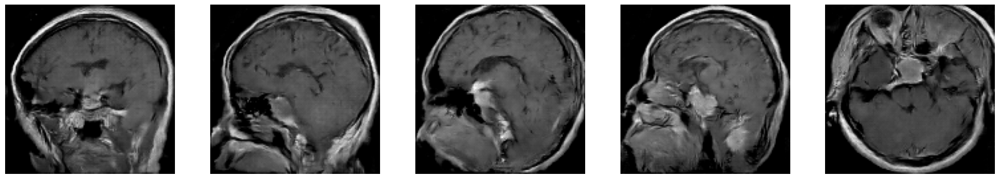

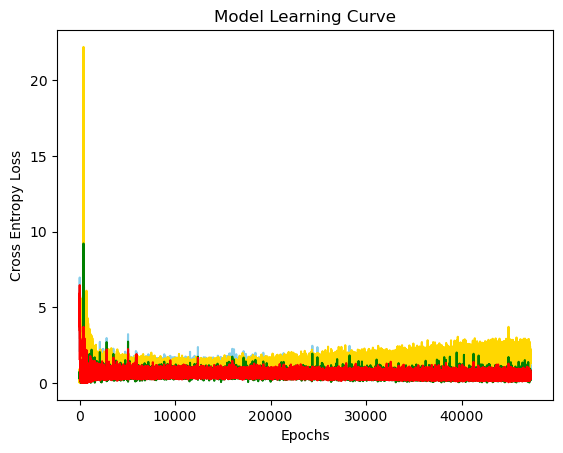

>800, 25/58, d=0.81857467, g=1.93082392
>800, 50/58, d=0.77627659, g=1.86980689
>801, 0/58, d=0.94036275, g=1.48867500
>801, 25/58, d=0.72024095, g=1.81560516
>801, 50/58, d=0.91451406, g=1.24536204
>802, 0/58, d=0.97798824, g=1.22185898
>802, 25/58, d=0.93054140, g=1.40035653
>802, 50/58, d=0.74428725, g=1.45327938
>803, 0/58, d=0.51497912, g=1.76306415
>803, 25/58, d=0.50217426, g=1.78313541
>803, 50/58, d=0.88808280, g=1.20020032
>804, 0/58, d=1.05649567, g=1.10264122
>804, 25/58, d=1.04305279, g=2.05281830
>804, 50/58, d=0.83764029, g=1.44981384
>805, 0/58, d=1.31703305, g=1.76247454
>805, 25/58, d=0.70649290, g=1.35827899
>805, 50/58, d=0.55865955, g=2.19536066
>806, 0/58, d=0.71340805, g=1.78100491
>806, 25/58, d=0.92845118, g=1.48712206
>806, 50/58, d=0.49935907, g=2.66957021
>807, 0/58, d=0.69685793, g=1.89944768
>807, 25/58, d=0.96346271, g=1.36161637
>807, 50/58, d=0.78439713, g=1.46727800
>808, 0/58, d=0.71825725, g=2.29759359
>808, 25/58, d=0.85184503, g=1.49711323
>808, 50

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

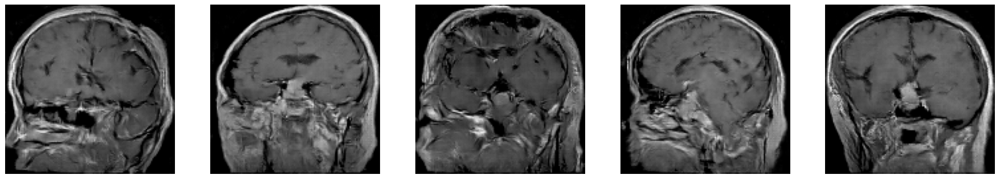

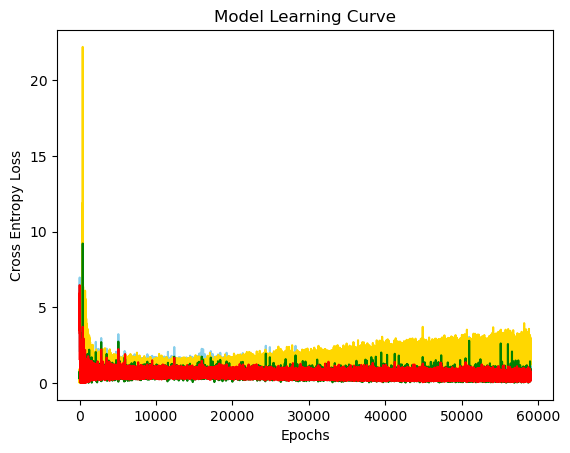

>1000, 25/58, d=0.83222049, g=1.97357619
>1000, 50/58, d=0.60113323, g=1.94472861
Model Saved!
>1001, 0/58, d=0.84028399, g=1.39866495
>1001, 25/58, d=0.50201035, g=1.82852793
>1001, 50/58, d=0.72586328, g=1.73649621
>1002, 0/58, d=0.61287665, g=2.39764214
>1002, 25/58, d=0.75339162, g=2.72403479
>1002, 50/58, d=0.83338809, g=2.13411188
>1003, 0/58, d=0.51858103, g=2.10297465
>1003, 25/58, d=0.75407022, g=2.44181061
>1003, 50/58, d=1.18874776, g=1.49534249
>1004, 0/58, d=0.59096515, g=1.37777638
>1004, 25/58, d=1.16411400, g=1.45670772
>1004, 50/58, d=0.83983934, g=1.53119993
>1005, 0/58, d=1.19066215, g=1.51844025
>1005, 25/58, d=0.52889109, g=2.09515047
>1005, 50/58, d=0.64266956, g=2.05631542
>1006, 0/58, d=0.86991084, g=1.00643694
>1006, 25/58, d=0.75467849, g=2.36837244
>1006, 50/58, d=0.70402443, g=1.65513134
>1007, 0/58, d=0.69104975, g=3.01214743
>1007, 25/58, d=0.52139270, g=2.35895824
>1007, 50/58, d=0.58165544, g=2.00520039
>1008, 0/58, d=0.96668077, g=1.74822438
>1008, 25/5

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

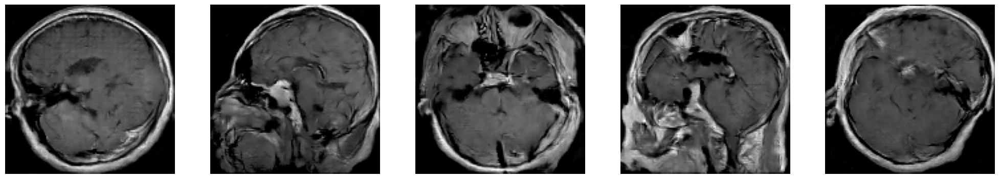

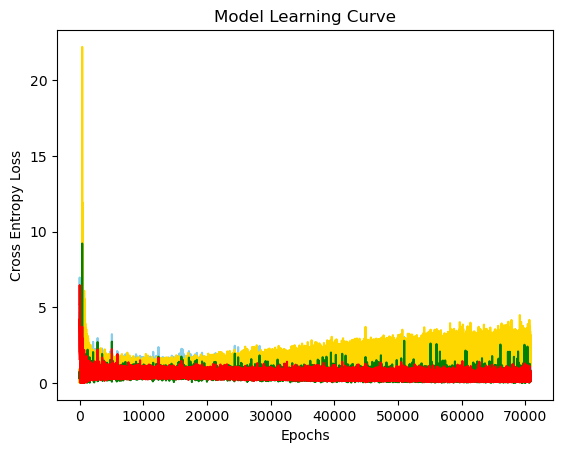

>1200, 25/58, d=0.83174801, g=1.50356722
>1200, 50/58, d=0.77933860, g=1.94267082
>1201, 0/58, d=0.99000728, g=1.83066070
>1201, 25/58, d=0.29527974, g=3.38479090
>1201, 50/58, d=0.65666294, g=2.59728956
>1202, 0/58, d=0.75158662, g=1.60249639
>1202, 25/58, d=1.07077408, g=1.35198748
>1202, 50/58, d=0.49040061, g=2.36444831
>1203, 0/58, d=0.51250696, g=1.92393720
>1203, 25/58, d=0.46726263, g=3.00903034
>1203, 50/58, d=0.66262126, g=2.62008929
>1204, 0/58, d=0.63083351, g=3.43171740
>1204, 25/58, d=0.91174579, g=1.52735615
>1204, 50/58, d=0.89843512, g=2.16840386
>1205, 0/58, d=0.42506519, g=2.88103676
>1205, 25/58, d=0.99464911, g=1.55222178
>1205, 50/58, d=0.56049544, g=2.85343337
>1206, 0/58, d=0.73485041, g=2.10677719
>1206, 25/58, d=0.63753551, g=2.08592367
>1206, 50/58, d=0.72557378, g=2.50071621
>1207, 0/58, d=0.80967599, g=1.63587880
>1207, 25/58, d=0.23807147, g=3.70583034
>1207, 50/58, d=0.49290437, g=2.35944748
>1208, 0/58, d=0.83809775, g=1.60258472
>1208, 25/58, d=0.780761

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

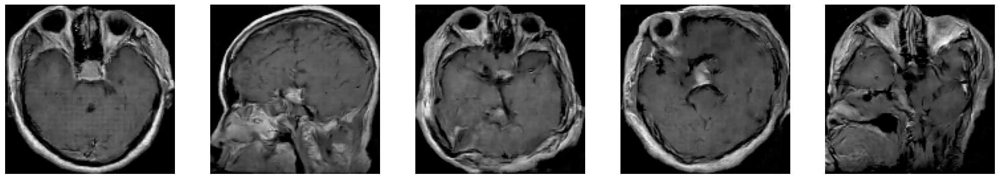

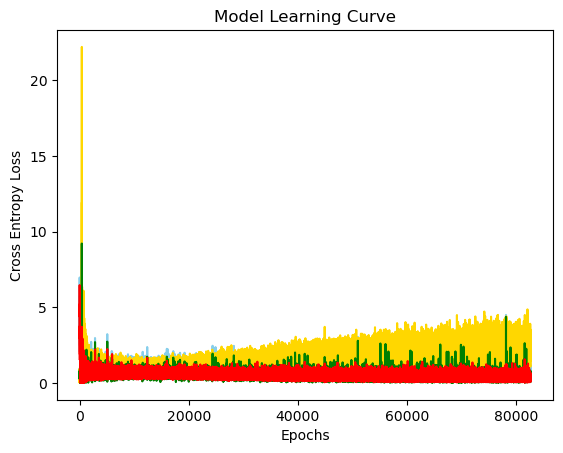

>1400, 25/58, d=0.69608521, g=2.10279465
>1400, 50/58, d=0.67601752, g=1.95962393
>1401, 0/58, d=1.21763206, g=1.39296675
>1401, 25/58, d=0.49622637, g=2.44905710
>1401, 50/58, d=0.56213731, g=3.04449105
>1402, 0/58, d=0.64814365, g=1.72719669
>1402, 25/58, d=0.37320513, g=3.06603336
>1402, 50/58, d=0.89802289, g=2.39321661
>1403, 0/58, d=0.75788873, g=2.24687028
>1403, 25/58, d=0.39771816, g=2.39180255
>1403, 50/58, d=0.54242265, g=2.39529276
>1404, 0/58, d=0.51429951, g=3.46309400
>1404, 25/58, d=0.53889012, g=3.01576900
>1404, 50/58, d=0.45353186, g=2.54182243
>1405, 0/58, d=0.94562697, g=2.05403757
>1405, 25/58, d=0.56761110, g=2.27430773
>1405, 50/58, d=0.56428254, g=2.83209085
>1406, 0/58, d=0.70555258, g=3.00585961
>1406, 25/58, d=0.73607385, g=3.18446755
>1406, 50/58, d=0.45051658, g=2.66186929
>1407, 0/58, d=1.04265690, g=1.19566512
>1407, 25/58, d=0.55487776, g=2.28901958
>1407, 50/58, d=0.80433327, g=2.37506104
>1408, 0/58, d=0.49840003, g=3.06041050
>1408, 25/58, d=0.764615

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

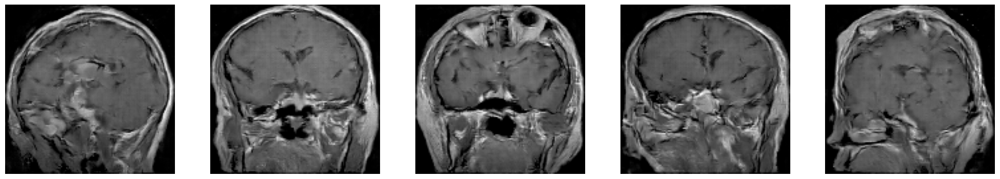

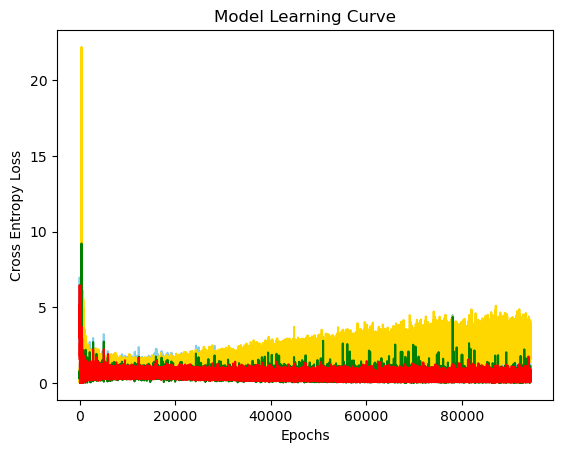

>1600, 25/58, d=0.50051951, g=2.90799713
>1600, 50/58, d=0.53908455, g=2.03036833
>1601, 0/58, d=0.57070756, g=2.52380085
>1601, 25/58, d=0.40124208, g=2.85910177
>1601, 50/58, d=0.76116705, g=2.10003471
>1602, 0/58, d=0.65164542, g=2.16218758
>1602, 25/58, d=0.83703792, g=2.15152407
>1602, 50/58, d=0.52532303, g=2.47740340
>1603, 0/58, d=0.69136667, g=3.04372191
>1603, 25/58, d=0.72454166, g=2.77948523
>1603, 50/58, d=0.48857147, g=4.08399248
>1604, 0/58, d=0.51579177, g=2.83818913
>1604, 25/58, d=0.99938929, g=2.27943134
>1604, 50/58, d=0.61936593, g=2.38349962
>1605, 0/58, d=0.58105254, g=2.82411766
>1605, 25/58, d=0.21587394, g=2.71453404
>1605, 50/58, d=0.49920765, g=2.42583084
>1606, 0/58, d=0.80058730, g=2.18348908
>1606, 25/58, d=0.74873698, g=1.87143970
>1606, 50/58, d=0.72522199, g=2.40703249
>1607, 0/58, d=0.67117321, g=2.61061382
>1607, 25/58, d=0.40613711, g=2.61771107
>1607, 50/58, d=0.76742887, g=2.43036938
>1608, 0/58, d=0.88883406, g=1.50373530
>1608, 25/58, d=0.521216

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

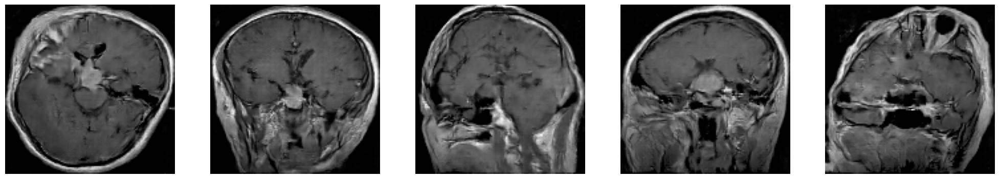

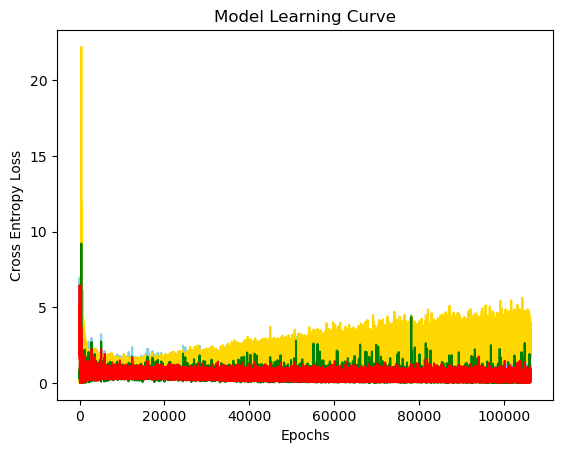

>1800, 25/58, d=0.70940149, g=2.58622837
>1800, 50/58, d=0.69225925, g=2.99492311
>1801, 0/58, d=0.63088548, g=2.47819781
>1801, 25/58, d=0.46386296, g=3.06599116
>1801, 50/58, d=0.69862211, g=2.18095899
>1802, 0/58, d=0.41586190, g=2.44247293
>1802, 25/58, d=0.59111607, g=2.49803591
>1802, 50/58, d=0.53458488, g=2.87085819
>1803, 0/58, d=0.41765338, g=3.25644660
>1803, 25/58, d=0.44431594, g=2.53816223
>1803, 50/58, d=0.36751401, g=4.36057138
>1804, 0/58, d=0.56555319, g=2.96302557
>1804, 25/58, d=0.61658412, g=4.50751305
>1804, 50/58, d=0.58273745, g=2.23936462
>1805, 0/58, d=0.45995298, g=3.59138441
>1805, 25/58, d=0.39002320, g=3.28363681
>1805, 50/58, d=0.43294400, g=3.21143293
>1806, 0/58, d=0.37802976, g=2.73395681
>1806, 25/58, d=0.34207559, g=2.99049950
>1806, 50/58, d=0.49086568, g=2.85139751
>1807, 0/58, d=0.84193885, g=2.76232719
>1807, 25/58, d=0.43080273, g=3.09437752
>1807, 50/58, d=0.35413224, g=3.27797675
>1808, 0/58, d=0.74365765, g=1.31469989
>1808, 25/58, d=0.640429

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

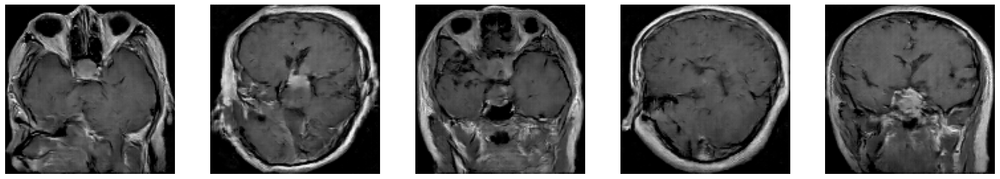

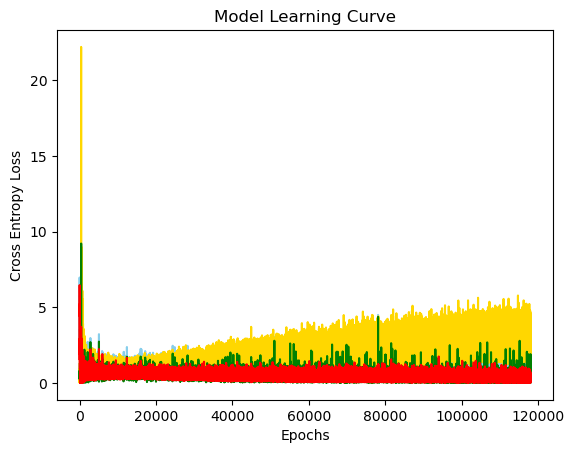

>2000, 25/58, d=1.11743164, g=2.67658234
>2000, 50/58, d=0.39961058, g=4.52430487
Model Saved!
>2001, 0/58, d=0.74564207, g=3.26154017
>2001, 25/58, d=0.53481853, g=3.42194080
>2001, 50/58, d=0.67335033, g=2.76370907
>2002, 0/58, d=0.24021810, g=3.42306018
>2002, 25/58, d=0.73294556, g=1.45526552
>2002, 50/58, d=0.38838977, g=2.51140499
>2003, 0/58, d=0.36241326, g=4.15739155
>2003, 25/58, d=0.42542046, g=3.63721132
>2003, 50/58, d=0.57502431, g=4.33095980
>2004, 0/58, d=0.52639866, g=1.91456461
>2004, 25/58, d=0.48509997, g=3.22142863
>2004, 50/58, d=0.26505387, g=3.77838278
>2005, 0/58, d=0.36353838, g=3.21477795
>2005, 25/58, d=0.94676006, g=3.28429437
>2005, 50/58, d=0.78598344, g=3.08591318
>2006, 0/58, d=0.62208468, g=2.50682378
>2006, 25/58, d=0.33320227, g=3.40427494
>2006, 50/58, d=0.57440174, g=3.22747946
>2007, 0/58, d=0.66008222, g=1.96689177
>2007, 25/58, d=0.51769221, g=2.36425638
>2007, 50/58, d=0.42551726, g=4.05538368
>2008, 0/58, d=0.26742560, g=2.78321052
>2008, 25/5

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

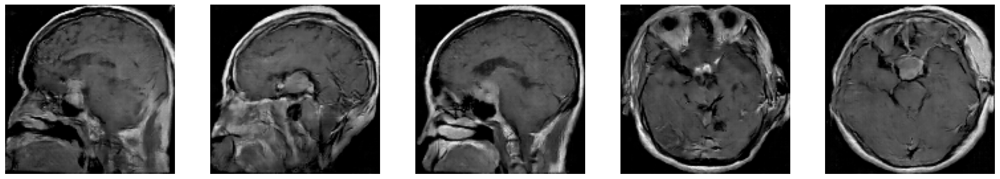

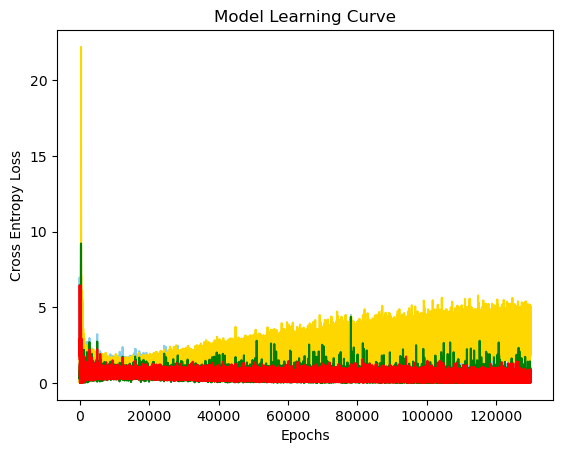

>2200, 25/58, d=0.35076451, g=3.00254107
>2200, 50/58, d=0.56098646, g=2.75518942
>2201, 0/58, d=0.66417432, g=3.82387424
>2201, 25/58, d=0.36346471, g=2.88916731
>2201, 50/58, d=0.51507282, g=3.37660694
>2202, 0/58, d=0.72735751, g=2.24783945
>2202, 25/58, d=0.63497585, g=3.17907763
>2202, 50/58, d=0.77563530, g=1.75248170
>2203, 0/58, d=0.50197154, g=4.31690550
>2203, 25/58, d=0.58313292, g=4.22169113
>2203, 50/58, d=0.84416020, g=3.26940417
>2204, 0/58, d=0.64198697, g=2.56930399
>2204, 25/58, d=0.35460770, g=2.63602972
>2204, 50/58, d=0.74393374, g=2.68619490
>2205, 0/58, d=0.65882659, g=2.47359991
>2205, 25/58, d=0.77972054, g=2.16724610
>2205, 50/58, d=0.74965227, g=3.53403258
>2206, 0/58, d=1.04158759, g=1.97756565
>2206, 25/58, d=0.43767881, g=3.43361282
>2206, 50/58, d=0.81027508, g=3.99888659
>2207, 0/58, d=0.42497712, g=3.07614613
>2207, 25/58, d=0.61200792, g=3.23926711
>2207, 50/58, d=0.70153230, g=2.00998688
>2208, 0/58, d=0.73920989, g=2.77107573
>2208, 25/58, d=0.397506

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

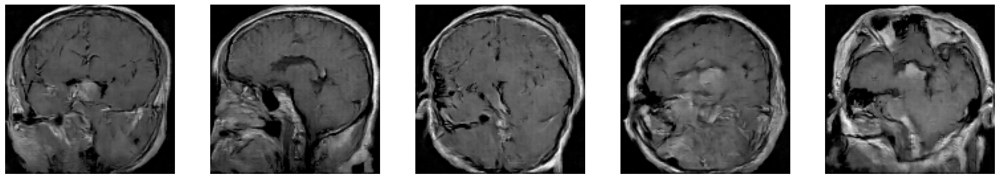

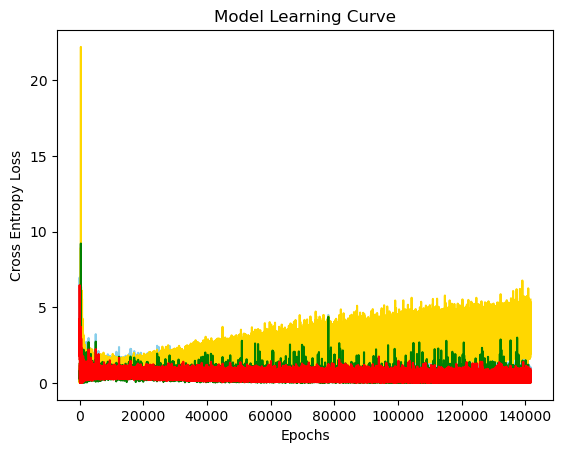

>2400, 25/58, d=0.15475905, g=5.32375526
>2400, 50/58, d=0.24380329, g=3.23691559
>2401, 0/58, d=0.39744294, g=4.90801048
>2401, 25/58, d=0.31261900, g=2.83695292
>2401, 50/58, d=0.75445926, g=2.18528986
>2402, 0/58, d=0.63865072, g=3.29245901
>2402, 25/58, d=0.41259521, g=3.99034166
>2402, 50/58, d=0.70715010, g=2.35676408
>2403, 0/58, d=1.02160823, g=1.84799099
>2403, 25/58, d=0.50659025, g=2.92254686
>2403, 50/58, d=0.88934451, g=1.73753011
>2404, 0/58, d=0.35972631, g=4.24965668
>2404, 25/58, d=0.18801273, g=4.03901482
>2404, 50/58, d=0.23214796, g=3.61236215
>2405, 0/58, d=0.25591683, g=3.16639757
>2405, 25/58, d=0.61328828, g=3.08399343
>2405, 50/58, d=0.55207235, g=3.43767071
>2406, 0/58, d=0.48837203, g=2.69784379
>2406, 25/58, d=0.21731076, g=3.28152966
>2406, 50/58, d=0.50277823, g=2.70907927
>2407, 0/58, d=0.51247877, g=4.14377022
>2407, 25/58, d=0.59776628, g=2.08029795
>2407, 50/58, d=0.72197175, g=2.86921048
>2408, 0/58, d=0.60957736, g=4.35856390
>2408, 25/58, d=0.810665

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

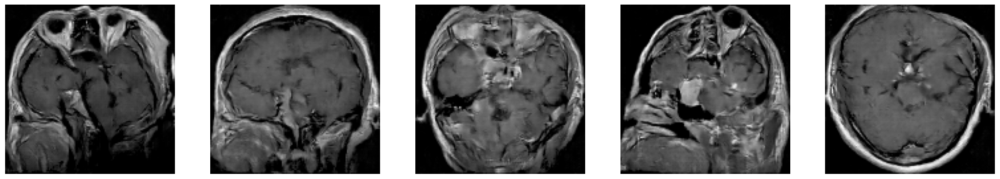

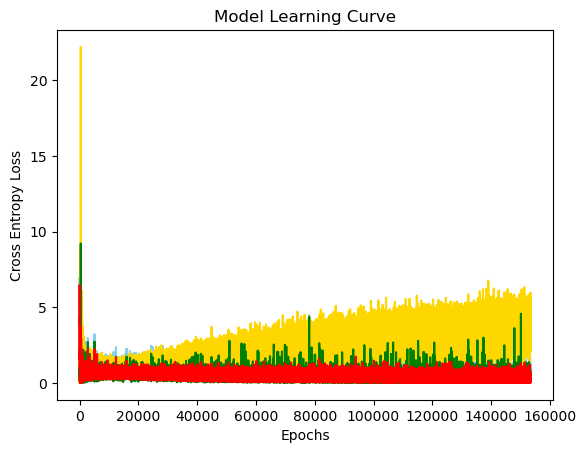

>2600, 25/58, d=0.56276757, g=3.17090750
>2600, 50/58, d=0.51179665, g=3.51964283
>2601, 0/58, d=0.46401513, g=2.26601434
>2601, 25/58, d=0.28065702, g=3.47770357
>2601, 50/58, d=0.63226736, g=2.53794074
>2602, 0/58, d=0.38568044, g=4.04647541
>2602, 25/58, d=0.52574682, g=4.70190811
>2602, 50/58, d=0.38043594, g=4.23588181
>2603, 0/58, d=0.53372163, g=4.15370035
>2603, 25/58, d=0.25260288, g=4.47097445
>2603, 50/58, d=0.42681381, g=3.33098102
>2604, 0/58, d=0.22574323, g=4.45334339
>2604, 25/58, d=0.17000192, g=4.82269382
>2604, 50/58, d=0.37488058, g=2.92386484
>2605, 0/58, d=0.76743901, g=4.27982950
>2605, 25/58, d=0.64022970, g=2.62558532
>2605, 50/58, d=0.66227436, g=2.35236669
>2606, 0/58, d=0.53884137, g=4.49003029
>2606, 25/58, d=0.68795133, g=2.35781002
>2606, 50/58, d=0.52222800, g=2.63186049
>2607, 0/58, d=0.84814179, g=2.31902051
>2607, 25/58, d=0.50565088, g=3.22460794
>2607, 50/58, d=0.30957347, g=4.14855003
>2608, 0/58, d=0.42811593, g=4.13972378
>2608, 25/58, d=0.303016

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

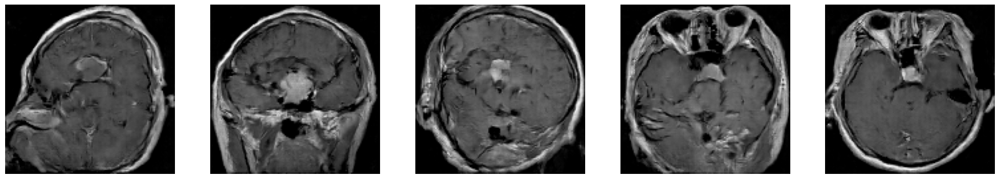

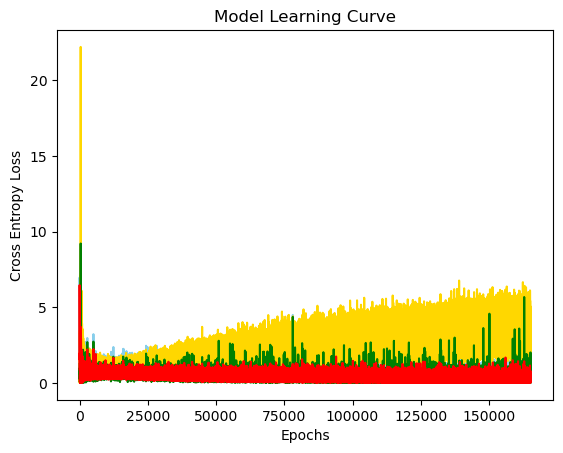

>2800, 25/58, d=0.94663596, g=3.08844733
>2800, 50/58, d=1.09180284, g=2.92941570
>2801, 0/58, d=0.41562498, g=3.77243257
>2801, 25/58, d=0.13029817, g=4.96772194
>2801, 50/58, d=0.37873626, g=4.75742054
>2802, 0/58, d=0.25272191, g=3.98755169
>2802, 25/58, d=0.24406645, g=4.16736031
>2802, 50/58, d=0.68133605, g=2.98165488
>2803, 0/58, d=0.46069393, g=2.88310957
>2803, 25/58, d=0.29498333, g=3.62100887
>2803, 50/58, d=0.62326741, g=3.39544010
>2804, 0/58, d=0.23976430, g=4.27491236
>2804, 25/58, d=0.53473347, g=4.63480854
>2804, 50/58, d=0.44877574, g=4.56559467
>2805, 0/58, d=1.09050810, g=3.00299835
>2805, 25/58, d=0.61223197, g=3.34613919
>2805, 50/58, d=0.55441535, g=3.33993721
>2806, 0/58, d=0.34823436, g=3.72755098
>2806, 25/58, d=0.20827492, g=4.55851793
>2806, 50/58, d=0.38936141, g=3.78383303
>2807, 0/58, d=0.76716369, g=3.79375076
>2807, 25/58, d=0.43865499, g=4.90175819
>2807, 50/58, d=0.27389044, g=4.76091766
>2808, 0/58, d=0.46222103, g=2.09102511
>2808, 25/58, d=0.242064

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

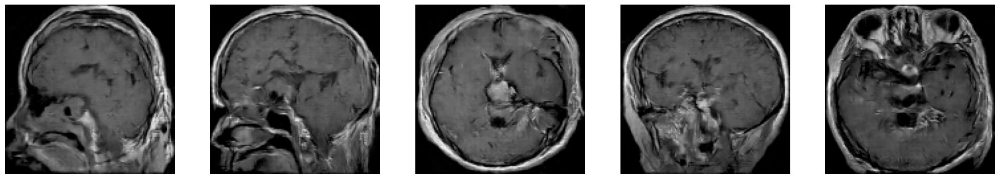

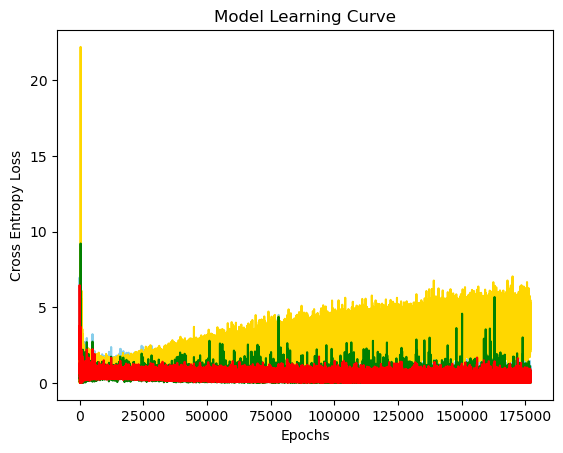

>3000, 25/58, d=0.59108257, g=2.82109690
>3000, 50/58, d=0.40556884, g=3.58914423
Model Saved!
>3001, 0/58, d=0.48495242, g=4.41989040
>3001, 25/58, d=0.87448114, g=2.66087484
>3001, 50/58, d=0.32234475, g=4.42552757


ValueError: too many values to unpack (expected 4)

<Figure size 2500x2500 with 0 Axes>

In [19]:
d_hist, g_hist, g_model, saved_checkpoint = train(train_dataset, EPOCHS)

In [ ]:
# from matplotlib import pyplot as plt
# def plot_learning_curve(d_loss_lst, gan_loss_lst):
#   fig = plt.figure()
#   plt.plot(d_loss_lst, color='skyblue')
#   plt.plot(gan_loss_lst, color='gold')
#   plt.title('Model Learning Curve')
#   plt.xlabel('Epochs'); plt.ylabel('Cross Entropy Loss')
#   plt.savefig('/kaggle/working/Learning Curves.png')

#   plt.show()

In [ ]:
# plot_learning_curve(d_hist, g_hist)

In [ ]:
# checkpoint_filepath = '/kaggle/input/ckpt-08-03/'
# # checkpoint_filepath = '/kaggle/input/ckpt-index-45/ckpt-45.index'
# generator_mode_instance.load_weights(checkpoint_filepath)
# generator_mode_instance.summmary()

In [ ]:
# #######look at generator images########
# # n_samples=5
# noise = tf.random.normal([DISPLAY_SAMPLES, LATENT_DIM])
# x_fake = g_model(noise,training=False)

# pyplot.figure(figsize=(25,25))
# for i in range(DISPLAY_SAMPLES):
#     # define subplot
#     pyplot.subplot(5, 5, 1 + i)
#     pyplot.axis('off')
#     # plot single image
#     pyplot.imshow(x_fake[i, :, :,0],cmap='gray')
# pyplot.show()
# pyplot.close()

In [ ]:
# #since calculating SSIM for one image is computationally expensive, just choose the index of one image to calculate
# #whichfake is the index of the sample image
# whichfake=4

# #create array to store SSIM values
# ssim_noise=[]

# #calculate SSIM for each training image
# for i in range(images.shape[0]):
#     ssim_noise.append( ssim(images[i,:,:,0], x_fake.numpy()[whichfake,:,:,0], 
#                       data_range=np.max(x_fake.numpy()[whichfake,:,:,0]) - np.min(x_fake.numpy()[whichfake,:,:,0])))

# #plot generated image and OASIS image that corresponds to the highest SSIM value
# fig, axs = pyplot.subplots(2, 1, constrained_layout=True,figsize=(10,10))
# axs[0].imshow(x_fake[whichfake, :, :, 0],cmap="gray")
# axs[0].set_title('Generated image with max SSIM: {:.4f}'.format(np.max(ssim_noise)))
# pyplot.savefig('/kaggle/working/Generated {}.png'.format(np.max(ssim_noise)))
# print("Generated image SSIM: ", np.max(ssim_noise))

# axs[1].imshow(images[ssim_noise.index(np.max(ssim_noise)), :, :, 0],cmap="gray")
# axs[1].set_title('Closest Pituitary image {:.0f}'.format(ssim_noise.index(np.max(ssim_noise))))
# pyplot.savefig('/kaggle/working/Closest Pituitary image {}.png'.format(np.max(ssim_noise)))
# print("Closest image SSIM: ", np.max(ssim_noise))
# pyplot.show()